In [1]:
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scipy.io
import scipy
from scipy import signal
import seaborn as sns

In [2]:
import librosa

In [3]:
DATABASE = {
    'Database 1': ['female_1',
                  'female_2',
                  'female_3',
                  'male_1',
                  'male_2'],
    'Database 2': ['male_day_1',
                  'male_day_2',
                  'male_day_3']
}

COLUMNS = ['cyl_ch1', 
            'cyl_ch2', 
            'hook_ch1', 
            'hook_ch2', 
            'tip_ch1', 
            'tip_ch2', 
            'palm_ch1', 
            'palm_ch2', 
            'spher_ch1', 
            'spher_ch2', 
            'lat_ch1', 
            'lat_ch2']

LABELS = [
    'Spherical',
    'Tip',
    'Palmar',
    'Lateral',
    'Cylindrical',
    'Hook'
]

COL_MAPPINGS = {
            'cyl_ch1': 'Cylindrical', 
            'cyl_ch2': 'Cylindrical', 
            'hook_ch1': 'Hook', 
            'hook_ch2': 'Hook', 
            'tip_ch1': 'Tip', 
            'tip_ch2': 'Tip', 
            'palm_ch1': 'Palmar', 
            'palm_ch2': 'Palmar', 
            'spher_ch1': 'Spherical', 
            'spher_ch2': 'Spherical', 
            'lat_ch1': 'Lateral', 
            'lat_ch2': 'Lateral'
}

In [4]:
""" Preprocess and standardize dataset into a single dataframe table
"""

DB_NAME = 'Database 1'
dfs = []
for fname in DATABASE[DB_NAME]: 
    tmp_data = scipy.io.loadmat(f'./data/{DB_NAME}/{fname}')
    tmp_data = {k:v for k,v in tmp_data.items() if k in COLUMNS}
    for c in COLUMNS:
        tmp_dfx = pd.DataFrame(tmp_data[c])
        tmp_dfx['identifier'] = fname
        tmp_dfx['label'] = COL_MAPPINGS[c]
        dfs.append(pd.DataFrame(tmp_dfx))

dataset = pd.concat(dfs)
print("Dimensions", dataset.shape)
dataset.head()

Dimensions (1800, 3002)


,0,1,2,3,4,5,6,7,8,9,...,2992,2993,2994,2995,2996,2997,2998,2999,identifier,label
0,0.072198,0.276211,0.429221,0.327214,0.123201,0.097700,0.072198,0.021195,-0.004307,0.174205,...,0.276211,-0.259323,0.072198,1.882814,0.480224,-2.528968,0.097700,0.837247,female_1,Cylindrical
1,0.250710,0.301713,0.199706,0.378218,0.021195,-0.080812,-0.106313,0.021195,0.276211,0.072198,...,-1.304890,0.786244,0.786244,0.939254,1.270775,-0.616346,0.454723,0.021195,female_1,Cylindrical
2,0.123201,0.148703,0.148703,0.123201,-0.004307,-0.157317,-0.029808,0.174205,0.199706,0.250710,...,-0.233821,0.403719,0.046696,-0.080812,0.378218,-0.361330,0.505726,0.607732,female_1,Cylindrical
3,0.531228,-0.106313,-0.284825,-0.335828,-0.182818,0.123201,0.301713,0.352716,0.327214,-0.029808,...,0.709739,0.276211,-0.080812,0.123201,0.735241,1.270775,-0.769356,-1.687415,female_1,Cylindrical
4,-0.310326,-0.182818,0.276211,0.480224,0.352716,0.123201,0.123201,0.097700,-0.029808,-0.080812,...,-0.208320,0.429221,0.378218,0.633234,0.811746,0.403719,-0.182818,-0.412333,female_1,Cylindrical


In [5]:
#combine coupled readouts
new_dfs = []
for lab in LABELS:
    new_temp = dataset[dataset['label'] == lab].values
    new_temp_comb = pd.DataFrame(np.concatenate((new_temp[:150,:3000],new_temp[150:,:3002]),axis=1))
    new_dfs.append(new_temp_comb)


new_dataset = pd.concat(new_dfs)
new_dataset.rename(columns={6001:'label', 6000:'identifier'}, inplace=True)
print("Dimension", new_dataset.shape)
new_dataset.head()

Dimension (900, 6002)


,0,1,2,3,4,5,6,7,8,9,...,5992,5993,5994,5995,5996,5997,5998,5999,identifier,label
0,0.505726,0.531228,0.505726,0.021195,0.046696,-0.080812,0.021195,0.021195,0.123201,0.199706,...,0.227693,0.049139,-0.30797,-0.103908,0.100154,0.15117,-0.614063,-0.358985,female_3,Spherical
1,0.454723,0.174205,-0.182818,-0.386831,0.709739,0.633234,-0.029808,-0.20832,0.0977,0.582231,...,-0.333478,0.100154,0.71234,0.610309,0.559294,-0.410001,0.253201,-0.052892,female_3,Spherical
2,1.245273,0.123201,-2.273952,-2.936995,-0.335828,1.50029,1.398283,2.163332,0.403719,-0.131815,...,0.253201,-0.486524,-0.231447,-0.30797,0.100154,0.865386,0.635817,0.15117,female_3,Spherical
3,-0.080812,-0.182818,0.0977,0.123201,0.276211,0.352716,0.25071,0.199706,0.0977,-0.080812,...,0.227693,-0.818125,-0.052892,0.431755,0.457263,0.304216,0.125662,0.304216,female_3,Spherical
4,0.480224,0.021195,0.429221,0.021195,-0.004307,-0.106313,0.199706,0.199706,0.301713,0.276211,...,-0.103908,-1.124218,0.278708,0.94191,0.686832,0.023631,-1.124218,-0.333478,female_3,Spherical


In [7]:
from cgitb import Hook


def abs_val_filter(data):
    """ Apply an absolute value filter to a DataFrame
    """
    return abs(data.copy())

def butterworth_low_pass_filter(data,     
                                frequency=500,         # sampling frequency
                                lp_filter=5,           # cutoff frequency
                                order=4):
    """
    Create a low pass filter to eliminate noise and smooth EMG data 
    
    The data were collected at a sampling rate of 500 Hz, 
    using as a programming kernel the National Instruments (NI) Labview. 
    The signals were band-pass filtered using a Butterworth Band Pass filter 
    with low and high cutoff at 15Hz and 500Hz respectively and a notch filter at 50Hz 
    to eliminate line interference artifacts.
    """
    lp_filter = lp_filter/(frequency/2)

    # Create a lowpass butterworth signal 
    B, A = scipy.signal.butter(order, 
                               lp_filter, 
                               btype='lowpass')


    # Apply the lowpass signal filter to EMG data
    smooth_emg = scipy.signal.filtfilt(B, 
                                       A, 
                                       data)
    return smooth_emg


def holt_smoothing(data,
                  s_level = 0.5,
                  s_slope = 0.1):
    smoothed = Hook(data[0]).fit(smoothing_level=s_level, smoothing_slope=s_slope).fittedvalues[:]
    print(data[0])
    print(smoothed)
    return smoothed

In [8]:
df_features = new_dataset.iloc[:,:6000].copy()
df_labels = new_dataset.iloc[:, 6001]
df_features = abs_val_filter(df_features)

In [9]:
smoothed_emg_df = butterworth_low_pass_filter(df_features.to_numpy(),
                                             frequency=5000,
                                             lp_filter=25)

In [10]:
import librosa.display
import IPython.display as ipd

## Extracting Short-Time Fourier Transform

In [15]:
Frame_size = 2048
HOP_size = 512

In [16]:
L = smoothed_emg_df.shape[0]
sr = 6000

In [26]:
smoothed_emg_df=np.array(smoothed_emg_df.astype(float))

In [32]:
def Plot_spectogram(y, sr, hop_length, y_axis="log"):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(y,
                             hop_length=hop_length,
                             x_axis = "time",
                             y_axis = y_axis)
    plt.colorbar(format="%+2.f")

<ipython-input-32-f688c6aac5ae>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(25, 10))


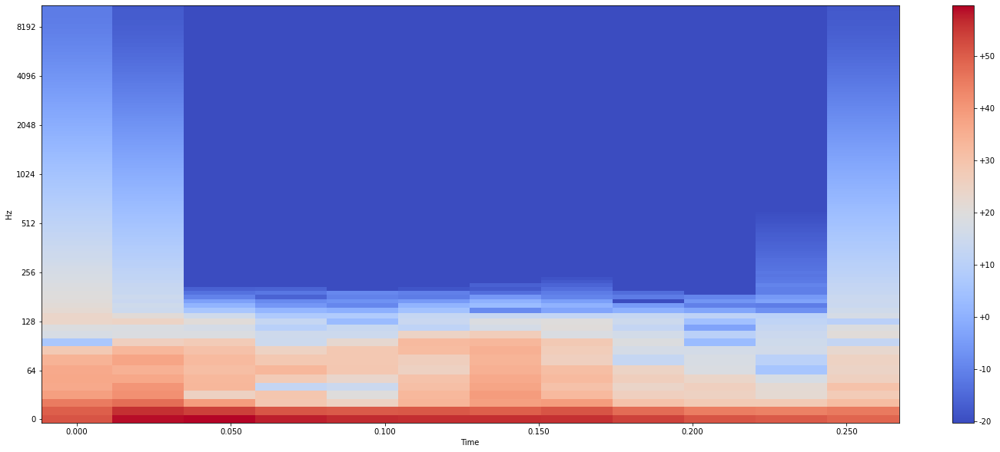

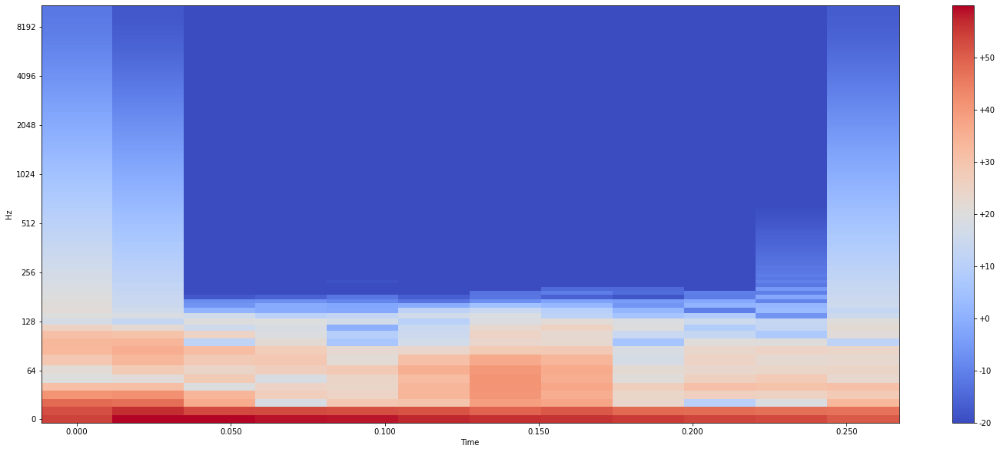

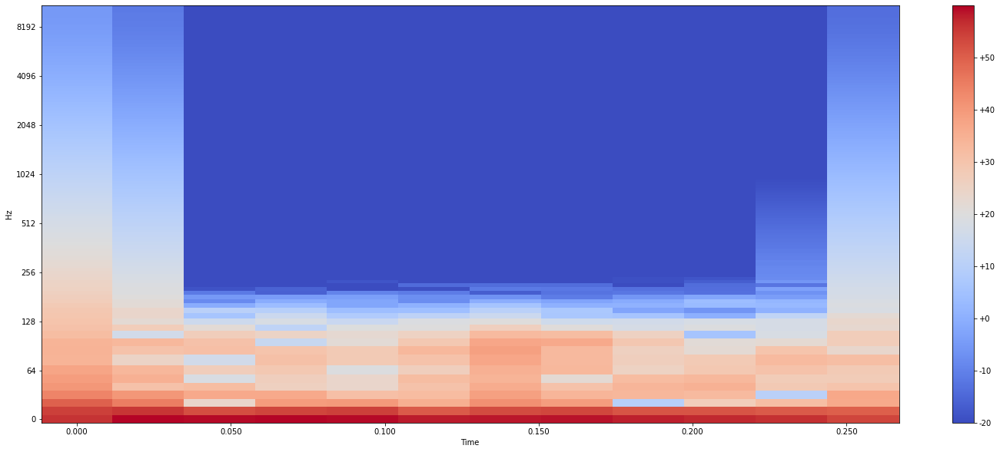

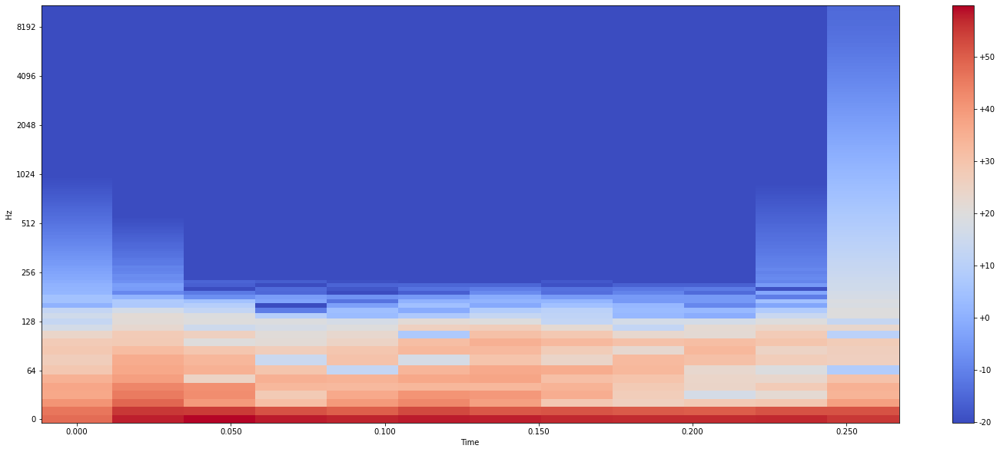

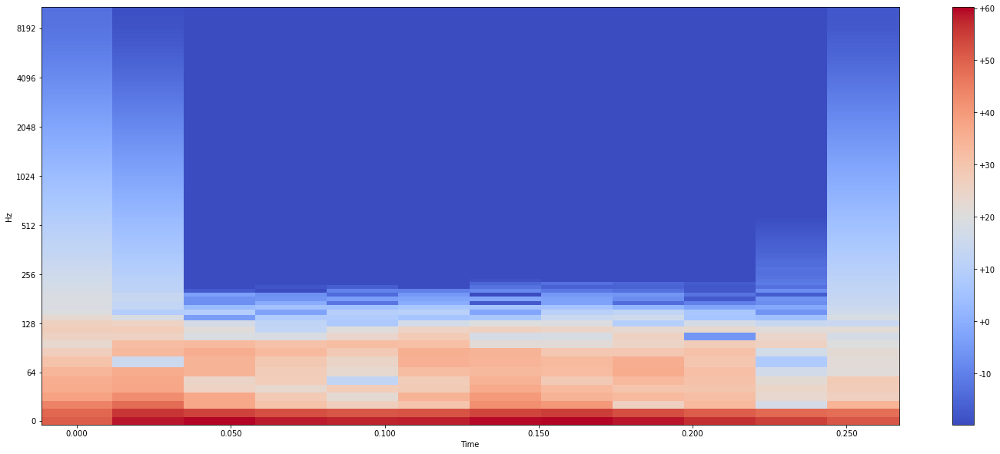

...

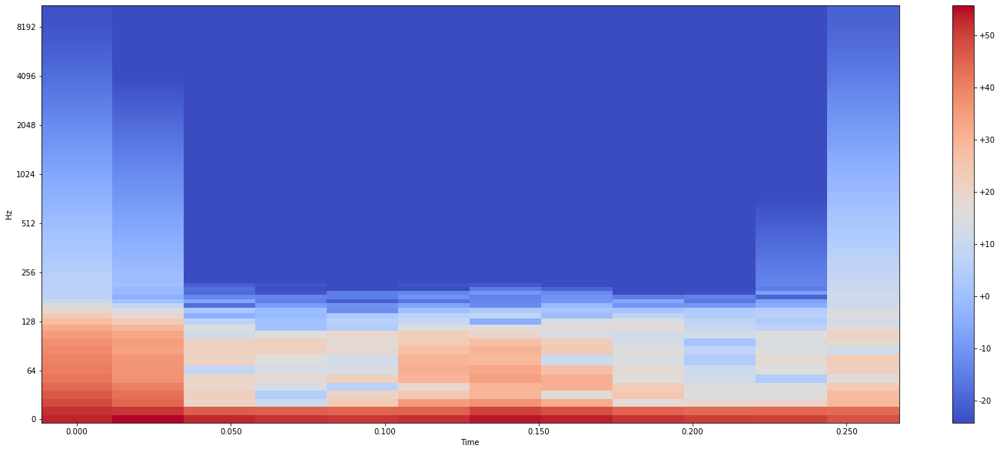

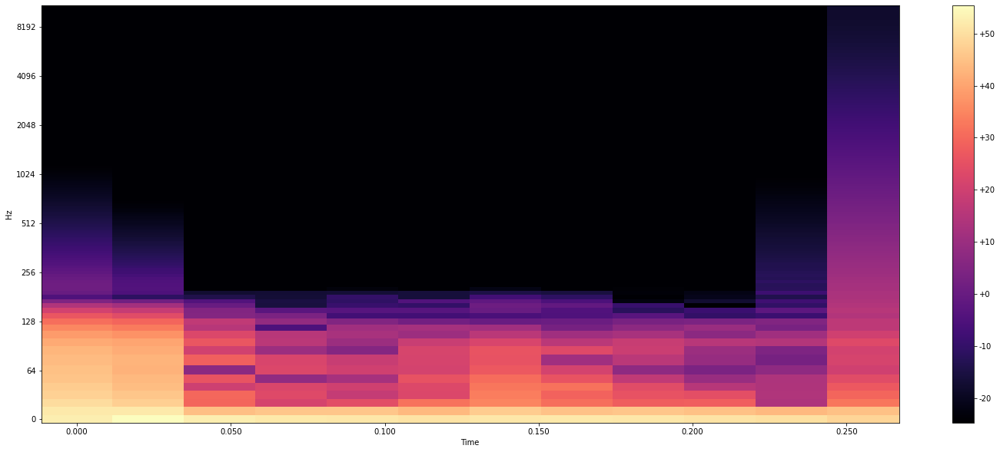

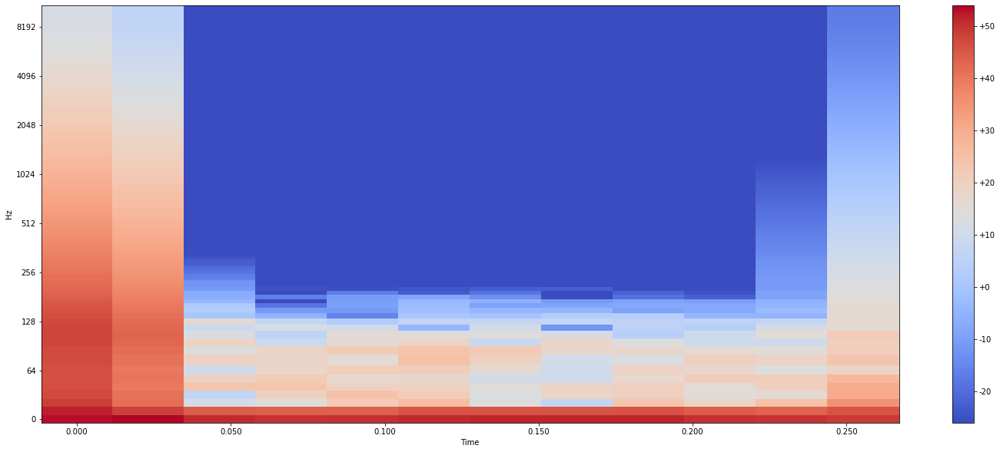

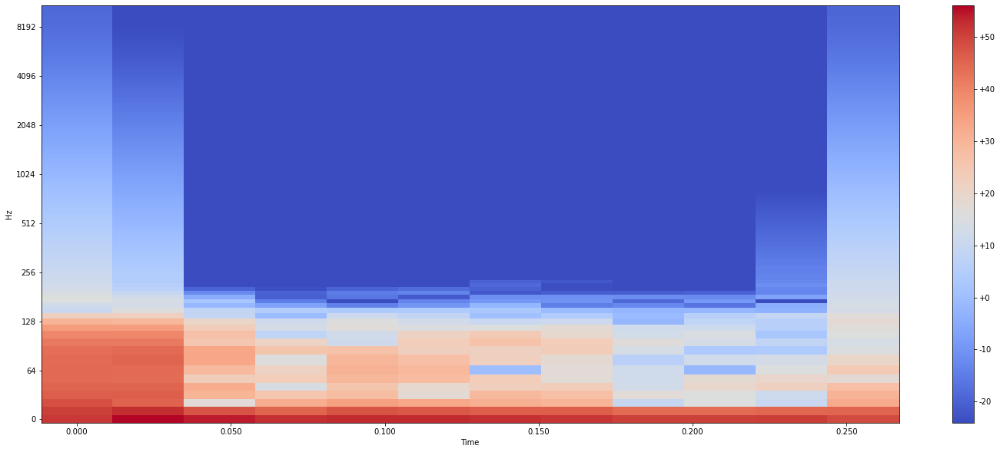

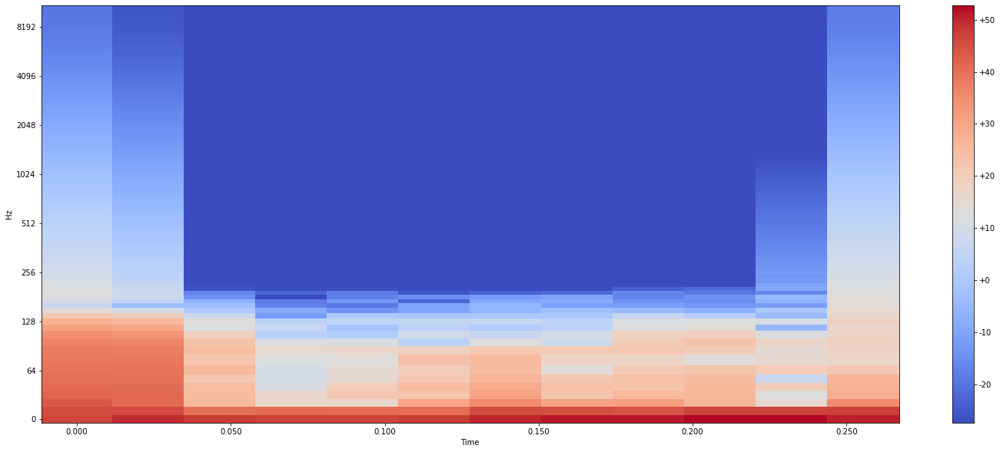

In [50]:
i=0
spect=[]
sav=[]
Y_spect=[]
for i in range(L):
    spect= librosa.stft(smoothed_emg_df[i,:], n_fft=Frame_size, hop_length=HOP_size)
    Y_spect = np.abs(spect) ** 2
    Y_log_spect = librosa.power_to_db(Y_spect)
    spct = Plot_spectogram(Y_log_spect, sr, HOP_size)
    sav = plt.savefig('C:/Users/INFO PLUS/Desktop/Stage CDTA/sEMG-signal-classification-master/specto/{0}.jpg'.format(i))



